# Lab 3

We will continue working with the [SUSY](https://archive.ics.uci.edu/ml/datasets/SUSY) and
[Higgs](https://archive.ics.uci.edu/ml/datasets/HIGGS) datasets in this lab and building some functions that would be useful to investigate any data. You will be making a lot of plots, separately for Higgs and SUSY datasets. Therefore use three separate notebooks and a python module:

* Copy of this lab where you work out the problems and make representative plots testing your code.
* A python module where you copy and paste the functions developed in this lab.
* Separate notebook containing plots, tables, and comments for
    * SUSY Dataset
    * Higgs Dataset

Make an effort to put in text boxes and organize your output so it is readable and well formatted. The goal of the SUSY/Higgs dataset is to present your analysis of the data, including your observations and motivation for your choices.

## Correlation

### Exercise 1

#### Part a
Write a function that creates pair plots and use it to compare variables in the SUSY and Higgs samples, separately for low and high-level features. Refer to [Data 1401 Visualization Lecture](https://github.com/UTA-DataScience/DATA1401.2020.Fall/blob/master/Lectures/Lecture.36/Lecture.36.ipynb) for details. Do not use `seaborn`.

#### Part b
Making these plots can be slow because creating each plot initiates a full loop over the data. Make at least one modification to your function in part a to speed it up. Can you propose a different method of creating histograms that would speed up making such pair plots?

#### Part c
Which observables appear to be best for separating signal from background?

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
filename="../../../Data/SUSY.csv"
!head -5  ../../../Data/SUSY.csv

0.000000000000000000e+00,9.728614687919616699e-01,6.538545489311218262e-01,1.176224589347839355e+00,1.157156467437744141e+00,-1.739873170852661133e+00,-8.743090629577636719e-01,5.677649974822998047e-01,-1.750000417232513428e-01,8.100607395172119141e-01,-2.525521218776702881e-01,1.921887040138244629e+00,8.896374106407165527e-01,4.107718467712402344e-01,1.145620822906494141e+00,1.932632088661193848e+00,9.944640994071960449e-01,1.367815494537353516e+00,4.071449860930442810e-02
1.000000000000000000e+00,1.667973041534423828e+00,6.419061869382858276e-02,-1.225171446800231934e+00,5.061022043228149414e-01,-3.389389812946319580e-01,1.672542810440063477e+00,3.475464344024658203e+00,-1.219136357307434082e+00,1.295456290245056152e-02,3.775173664093017578e+00,1.045977115631103516e+00,5.680512785911560059e-01,4.819284379482269287e-01,0.000000000000000000e+00,4.484102725982666016e-01,2.053557634353637695e-01,1.321893453598022461e+00,3.775840103626251221e-01
1.000000000000000000e+00,4.4483992457389831

In [9]:
VarNames=["signal", "l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi", "MET_rel", "axial_MET", "M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]
RawNames=["l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi"]
FeatureNames=list(set(VarNames[1:]).difference(RawNames))

In [10]:
df = pd.read_csv(filename, dtype='float64', names=VarNames)

In [11]:
def alternatespace(x, y):
    group = list()
    for a in range(y):
        for b in range(x):
            group.append([b, a])
    return group

In [12]:
def pairplots(dataset, size = 60):
    a = len(dataset.columns)
    fig, axs = plt.subplots(a-1, a-1, figsize=(size, size))
    for c, t in enumerate(alternatespace(a, a)):
        if dataset.columns[t[0]] == 'signal':
            pass
        elif dataset.columns[t[1]] == 'signal':
            pass
        else:
            if t[0] == t[1]:
                axs[t[0]-1][t[1]-1].hist(dataset.loc[dataset['signal'] == 0][dataset.columns[[t[0]]]], color ='tab:blue', histtype = 'step', bins=100)
                axs[t[0]-1][t[1]-1].hist(dataset.loc[dataset['signal'] == 1][dataset.columns[[t[0]]]], color ='tab:orange', histtype = 'step', bins=100)
                axs[t[0]-1][t[1]-1].title.set_text(dataset.columns[t[0]]+' vs. '+dataset.columns[t[1]])
            else:
                if t[0]>t[1]:
                    axs[t[0]-1][t[1]-1].scatter(dataset.loc[dataset['signal'] == 0][dataset.columns[[t[0]]]],dataset.loc[dataset['signal'] == 0][dataset.columns[t[1]]], color ='tab:blue')
                    axs[t[0]-1][t[1]-1].scatter(dataset.loc[dataset['signal'] == 1][dataset.columns[[t[0]]]],dataset.loc[dataset['signal'] == 1][dataset.columns[t[1]]], color ='tab:orange')
                    axs[t[0]-1][t[1]-1].title.set_text(dataset.columns[t[0]]+' vs. '+dataset.columns[t[1]])
                if t[0]<t[1]:
                    axs[t[0]-1][t[1]-1].scatter(dataset.loc[dataset['signal'] == 1][dataset.columns[[t[0]]]],dataset.loc[dataset['signal'] == 1][dataset.columns[t[1]]], color ='tab:orange')
                    axs[t[0]-1][t[1]-1].scatter(dataset.loc[dataset['signal'] == 0][dataset.columns[[t[0]]]],dataset.loc[dataset['signal'] == 0][dataset.columns[t[1]]], color ='tab:blue')
                    axs[t[0]-1][t[1]-1].title.set_text(dataset.columns[t[0]]+' vs. '+dataset.columns[t[1]])

In [7]:
#a
pairplots(df, 200)

In [8]:
#b: Use the processed data from one triangle of the graphs onto the other to cut the processing time

In [9]:
#c: combination of Met_rel, M_R and S_R show some of the stituations where the signal is highly concentrated in a small area

### Exercise 2

#### Part a
Install [tabulate](https://github.com/astanin/python-tabulate). 

#### Part b
Use numpy to compute the [covariance matrix](https://numpy.org/doc/stable/reference/generated/numpy.cov.html) and [correlation matrix](https://numpy.org/doc/stable/reference/generated/numpy.corrcoef.html) between all observabes, and separately between low and high-level features.

#### Part c
Use tabulate to create a well formatted table of the covariance and correlation matrices, with nice headings and appropriate significant figures. Embed the table into this notebook.

#### Part d
Write a function that takes a dataset and appropriate arguments and performs steps b and c.  

Hint: Example code for embedding a `tabulate` table into a notebook:

In [10]:
from IPython.display import HTML, display
import tabulate
table = [["A",1,2],
        ["C",3,4],
        ["D",5,6]]
display(HTML(tabulate.tabulate(table, tablefmt='html', headers=["X","Y","Z"])))

X,Y,Z
A,1,2
C,3,4
D,5,6


In [13]:
import numpy as np

In [12]:
def tab_everything(dataframe):
    seperate_matricies = [dataframe.iloc[:, 1:], dataframe.loc[dataframe['signal'] == 0].iloc[:, 1:], dataframe.loc[dataframe['signal'] == 1].iloc[:, 1:]]
    mat_titles = ['Full Data', 'Signal 0', 'Signal 1']
    for n, mat in enumerate(seperate_matricies):
        print(mat_titles[n]+' Correlation Coeficent')
        head = mat.columns.tolist()
        table = np.corrcoef(np.rot90(mat)).tolist()
        for i, t in enumerate(table):
            t.insert(0, head[i])
        display(HTML(tabulate.tabulate(table, tablefmt='html', headers=head)))
        print(mat_titles[n]+' Covariance')
        table = np.cov(np.rot90(mat)).tolist()
        for i, t in enumerate(table):
            t.insert(0, head[i])
        display(HTML(tabulate.tabulate(table, tablefmt='html', headers=head)))

In [13]:
tab_everything(df)

Full Data Correlation Coeficent


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,1,0.106269,0.319037,-0.0836113,0.263091,0.627296,0.451471,-0.114588,-0.274339,0.317117,0.00029282,0.426065,-0.00100659,0.00100587,-0.215695,0.00151792,0.000737625,0.166311
l_1_eta,0.106269,1,0.155819,-0.0134163,0.0564966,0.424334,0.228214,-0.106231,-0.0600043,0.377634,-0.00302921,0.381648,0.000557847,-0.000117896,-0.0144321,0.00218306,0.000182076,-0.156878
l_1_phi,0.319037,0.155819,1,0.248317,0.808488,0.564009,0.665531,0.189362,-0.374708,0.748617,-0.000637942,0.581489,0.000794488,-0.000342981,0.0136055,0.00210045,-0.000805723,0.228773
l_2_pT,-0.0836113,-0.0134163,0.248317,1,-0.0209354,-0.285461,0.635598,0.98136,-0.0698356,0.14916,-0.00183464,0.308832,0.000616899,-0.000889368,0.799394,7.2309e-05,-0.000451966,0.811653
l_2_eta,0.263091,0.0564966,0.808488,-0.0209354,1,0.573951,0.377562,-0.0677791,-0.534862,0.536064,0.000587288,0.20851,0.00144484,-0.000105173,-0.122992,0.00203798,-0.000182869,-0.0216362
l_2_phi,0.627296,0.424334,0.564009,-0.285461,0.573951,1,0.379836,-0.381384,-0.385164,0.595311,-0.000346425,0.45877,0.000497531,0.000536711,-0.322419,0.00185828,0.000270458,-0.18319
MET,0.451471,0.228214,0.665531,0.635598,0.377562,0.379836,1,0.577579,-0.322606,0.583403,-0.00143922,0.721952,0.000492263,-0.000285448,0.430171,0.00143188,-0.000453809,0.724394
MET_phi,-0.114588,-0.106231,0.189362,0.98136,-0.0677791,-0.381384,0.577579,1,0.0239815,0.0780776,-0.00154893,0.265832,0.000455365,-0.000870422,0.797551,-0.000317026,-0.000488455,0.851602
MET_rel,-0.274339,-0.0600043,-0.374708,-0.0698356,-0.534862,-0.385164,-0.322606,0.0239815,1,-0.140506,-0.000950054,0.165628,-9.10606e-05,-0.00016938,0.0759957,-0.0019583,-0.000495182,-0.0181743
axial_MET,0.317117,0.377634,0.748617,0.14916,0.536064,0.595311,0.583403,0.0780776,-0.140506,1,-0.0032744,0.705724,0.000240441,0.000145498,-0.00387855,0.00171469,-0.000556196,0.161098


Full Data Covariance


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,0.0388013,0.00912875,0.0392001,-0.0102231,0.0445295,0.0581794,0.0519458,-0.0141941,-0.0541256,0.055605,5.77751e-05,0.0732584,-0.000198602,0.000198699,-0.0277963,0.0002995,0.000145749,0.0225171
l_1_eta,0.00912875,0.190179,0.0423863,-0.00363167,0.0211701,0.087129,0.0581329,-0.0291322,-0.0262092,0.146597,-0.00132321,0.145279,0.000243671,-5.15597e-05,-0.0041175,0.000953611,7.96493e-05,-0.0470231
l_1_phi,0.0392001,0.0423863,0.389086,0.0961442,0.433327,0.165647,0.242487,0.0742776,-0.234103,0.415675,-0.000398585,0.316608,0.000496384,-0.000214547,0.00555216,0.00131238,-0.000504145,0.0980831
l_2_pT,-0.0102231,-0.00363167,0.0961442,0.385289,-0.0111659,-0.0834283,0.230448,0.383059,-0.0434172,0.0824171,-0.00114068,0.16733,0.000383544,-0.000553613,0.324622,4.49584e-05,-0.000281414,0.346283
l_2_eta,0.0445295,0.0211701,0.433327,-0.0111659,0.738309,0.232203,0.189498,-0.0366234,-0.460312,0.410022,0.000505462,0.156388,0.00124351,-9.06262e-05,-0.0691387,0.00175405,-0.000157618,-0.0127782
l_2_phi,0.0581794,0.087129,0.165647,-0.0834283,0.232203,0.221691,0.104464,-0.112922,-0.18164,0.249511,-0.000163381,0.18855,0.00023464,0.000253423,-0.0993157,0.000876413,0.000127738,-0.0592849
MET,0.0519458,0.0581329,0.242487,0.230448,0.189498,0.104464,0.341189,0.212154,-0.188739,0.303346,-0.000842059,0.368099,0.000288007,-0.000167207,0.164385,0.000837778,-0.0002659,0.290831
MET_phi,-0.0141941,-0.0291322,0.0742776,0.383059,-0.0366234,-0.112922,0.212154,0.395446,0.0151046,0.043706,-0.000975646,0.145918,0.000286821,-0.000548914,0.328115,-0.000199693,-0.000308117,0.368085
MET_rel,-0.0541256,-0.0262092,-0.234103,-0.0434172,-0.460312,-0.18164,-0.188739,0.0151046,1.00319,-0.125273,-0.000953142,0.144805,-9.13545e-05,-0.000170132,0.0497971,-0.00196469,-0.000497512,-0.0125117
axial_MET,0.055605,0.146597,0.415675,0.0824171,0.410022,0.249511,0.303346,0.043706,-0.125273,0.792397,-0.00291959,0.548358,0.000214381,0.000129885,-0.00225873,0.00152891,-0.000496646,0.0985665


Signal 0 Correlation Coeficent


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,1,0.105747,0.238733,-0.254303,0.237001,0.598898,0.304607,-0.270268,-0.353732,0.269695,0.000581017,0.409422,-0.00165157,0.00149615,-0.267822,0.0016233,0.0010334,-0.0164378
l_1_eta,0.105747,1,0.117844,-0.0280903,0.0791608,0.390646,0.282896,-0.0982509,-0.265056,0.430835,-0.00344436,0.519151,0.00107199,-0.000377321,-0.0347056,0.00182107,0.000480082,-0.158423
l_1_phi,0.238733,0.117844,1,0.128926,0.930395,0.591671,0.725851,0.0949235,-0.78705,0.805038,-0.00065706,0.734557,0.000494289,7.66463e-07,-0.042357,0.00212434,-8.86709e-05,0.0994303
l_2_pT,-0.254303,-0.0280903,0.128926,1,-0.0345713,-0.428347,0.49924,0.994926,-0.0947994,0.00685004,-0.00130725,0.148982,0.00112151,-0.000874361,0.791952,-2.01635e-05,-0.00019812,0.806927
l_2_eta,0.237001,0.0791608,0.930395,-0.0345713,1,0.641335,0.583306,-0.065782,-0.758301,0.769821,0.000318361,0.603244,0.000554581,8.38569e-05,-0.112993,0.00218715,-0.000135011,-0.0464576
l_2_phi,0.598898,0.390646,0.591671,-0.428347,0.641335,1,0.382958,-0.481999,-0.593185,0.683168,-0.00027763,0.649866,0.000336669,0.000502151,-0.374533,0.00167805,0.000254449,-0.312031
MET,0.304607,0.282896,0.725851,0.49924,0.583306,0.382958,1,0.459012,-0.695265,0.642437,-0.00190627,0.826029,0.000963781,-0.000265253,0.408634,0.00233995,0.000122024,0.601234
MET_phi,-0.270268,-0.0982509,0.0949235,0.994926,-0.065782,-0.481999,0.459012,1,-0.0394167,-0.0522888,-0.0011024,0.0879403,0.000954465,-0.000796554,0.794414,-0.000297552,-0.000190449,0.818324
MET_rel,-0.353732,-0.265056,-0.78705,-0.0947994,-0.758301,-0.593185,-0.695265,-0.0394167,1,-0.685026,-0.000747252,-0.657002,0.000326542,6.32122e-05,0.0372925,-0.00363684,-0.000223792,-0.105144
axial_MET,0.269695,0.430835,0.805038,0.00685004,0.769821,0.683168,0.642437,-0.0522888,-0.685026,1,-0.00327252,0.823504,0.000866247,0.00033306,-0.100513,0.0019605,0.000182509,-0.023644


Signal 0 Covariance


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,0.0257453,0.00748749,0.0190846,-0.022517,0.027865,0.043102,0.0167558,-0.0239468,-0.027117,0.0236953,9.33534e-05,0.0230518,-0.00026535,0.000261438,-0.0232013,0.000260956,0.000183457,-0.00116274
l_1_eta,0.00748749,0.194732,0.0259087,-0.00684048,0.025597,0.0773208,0.0427977,-0.023942,-0.0558823,0.104105,-0.00152201,0.0803891,0.000473676,-0.000181332,-0.00826867,0.000805126,0.000234395,-0.0308195
l_1_phi,0.0190846,0.0259087,0.248224,0.0354465,0.339663,0.13222,0.123978,0.0261156,-0.187345,0.219624,-0.000327807,0.12842,0.00024659,4.15869e-07,-0.0113937,0.00106039,-4.88785e-05,0.0218388
l_2_pT,-0.022517,-0.00684048,0.0354465,0.304524,-0.0139793,-0.106023,0.0944485,0.303184,-0.0249939,0.00206988,-0.000722372,0.0288489,0.00061971,-0.000525468,0.235954,-1.1148e-05,-0.000120964,0.196306
l_2_eta,0.027865,0.025597,0.339663,-0.0139793,0.536931,0.210785,0.146531,-0.0266177,-0.265472,0.30888,0.000233599,0.155109,0.00040691,6.69179e-05,-0.0447019,0.00160568,-0.000109457,-0.0150074
l_2_phi,0.043102,0.0773208,0.13222,-0.106023,0.210785,0.201182,0.0588872,-0.119384,-0.127117,0.167789,-0.000124696,0.102283,0.000151207,0.000245286,-0.0906989,0.000754083,0.000126273,-0.0616996
MET,0.0167558,0.0427977,0.123978,0.0944485,0.146531,0.0588872,0.11753,0.0868967,-0.113879,0.1206,-0.000654413,0.0993698,0.000330847,-9.90326e-05,0.0756355,0.000803712,4.62842e-05,0.0908671
MET_phi,-0.0239468,-0.023942,0.0261156,0.303184,-0.0266177,-0.119384,0.0868967,0.304936,-0.0103993,-0.0158108,-0.000609586,0.0170403,0.000527762,-0.000479031,0.236847,-0.000164622,-0.000116359,0.199213
MET_rel,-0.027117,-0.0558823,-0.187345,-0.0249939,-0.265472,-0.127117,-0.113879,-0.0103993,0.228263,-0.179211,-0.0003575,-0.110146,0.000156218,3.28899e-05,0.00961957,-0.00174085,-0.000118298,-0.0221458
axial_MET,0.0236953,0.104105,0.219624,0.00206988,0.30888,0.167789,0.1206,-0.0158108,-0.179211,0.299835,-0.00179438,0.158231,0.00047496,0.000198613,-0.0297155,0.00107554,0.000110571,-0.00570757


Signal 1 Correlation Coeficent


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,1,0.100055,0.281396,-0.0992976,0.261336,0.650825,0.431219,-0.151123,-0.313603,0.2634,1.3141e-05,0.368202,-0.000491216,0.000410859,-0.29373,0.00181439,0.00073299,0.112046
l_1_eta,0.100055,1,0.187876,-0.0172174,0.0326838,0.461785,0.23242,-0.142004,0.0110671,0.395943,-0.00253587,0.447369,-6.02293e-05,0.000236663,-0.00989386,0.00266084,-0.000251988,-0.215757
l_1_phi,0.281396,0.187876,1,0.23699,0.751908,0.539982,0.602904,0.147938,-0.32818,0.709916,-0.000744124,0.516814,0.00117923,-0.000978469,-0.0416854,0.0025369,-0.00151799,0.158282
l_2_pT,-0.0992976,-0.0172174,0.23699,1,-0.0495315,-0.235261,0.680645,0.967659,-0.102508,0.123356,-0.00256477,0.276444,0.000211759,-0.00124219,0.793501,0.00041908,-0.000632237,0.821543
l_2_eta,0.261336,0.0326838,0.751908,-0.0495315,1,0.518502,0.301076,-0.1125,-0.517333,0.450078,0.00082351,0.0936161,0.00228373,-0.000381958,-0.159971,0.00203004,-0.000194817,-0.0630181
l_2_phi,0.650825,0.461785,0.539982,-0.235261,0.518502,1,0.386035,-0.382823,-0.37705,0.582403,-0.000452095,0.460035,0.000702846,0.000502816,-0.340584,0.00219095,0.000395071,-0.221024
MET,0.431219,0.23242,0.602904,0.680645,0.301076,0.386035,1,0.591272,-0.335943,0.501968,-0.00163098,0.637331,0.000421938,-0.000741572,0.392142,0.00163789,-0.00077079,0.694311
MET_phi,-0.151123,-0.142004,0.147938,0.967659,-0.1125,-0.382823,0.591272,1,0.018581,0.0298154,-0.00217809,0.217741,5.63318e-05,-0.00130481,0.787728,-0.000107965,-0.000722273,0.880823
MET_rel,-0.313603,0.0110671,-0.32818,-0.102508,-0.517333,-0.37705,-0.335943,0.018581,1,-0.0675277,-0.00121196,0.252827,-0.000265918,-0.000386425,0.0738103,-0.00155544,-0.000746201,-0.0414029
axial_MET,0.2634,0.395943,0.709916,0.123356,0.450078,0.582403,0.501968,0.0298154,-0.0675277,1,-0.00386965,0.656893,-3.58932e-05,-0.000162838,-0.048067,0.00208302,-0.00107629,0.0845774


Signal 1 Covariance


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,0.0481527,0.00942661,0.0433432,-0.0142025,0.0563887,0.0699551,0.0650714,-0.0220302,-0.0950767,0.064307,2.88939e-06,0.0884559,-0.000108006,8.02311e-05,-0.0479895,0.000398706,0.0001391,0.019779
l_1_eta,0.00942661,0.184338,0.0566203,-0.00481825,0.0137982,0.0971161,0.0686219,-0.0405029,0.00656483,0.189135,-0.00109094,0.210283,-2.59109e-05,9.04225e-05,-0.00316271,0.00114403,-9.35637e-05,-0.0745195
l_1_phi,0.0433432,0.0566203,0.492703,0.108427,0.518967,0.185659,0.29102,0.068984,-0.318264,0.554411,-0.000523366,0.397153,0.000829388,-0.000611195,-0.0217853,0.00178323,-0.000921468,0.0893761
l_2_pT,-0.0142025,-0.00481825,0.108427,0.424843,-0.0317452,-0.0751117,0.305082,0.419,-0.0923115,0.0894557,-0.00167506,0.197266,0.0001383,-0.000720515,0.385078,0.000273541,-0.00035638,0.430767
l_2_eta,0.0563887,0.0137982,0.518967,-0.0317452,0.966861,0.249734,0.203582,-0.0734875,-0.702806,0.492382,0.000811369,0.100777,0.00225005,-0.000334224,-0.117114,0.00199893,-0.000165665,-0.0498477
l_2_phi,0.0699551,0.0971161,0.185659,-0.0751117,0.249734,0.239933,0.130033,-0.124572,-0.255168,0.317395,-0.000221892,0.246698,0.000344962,0.000219176,-0.12421,0.0010747,0.000167355,-0.0870928
MET,0.0650714,0.0686219,0.29102,0.305082,0.203582,0.130033,0.472893,0.270113,-0.319175,0.384052,-0.00112382,0.479818,0.000290735,-0.00045381,0.200776,0.00112792,-0.000458392,0.38409
MET_phi,-0.0220302,-0.0405029,0.068984,0.419,-0.0734875,-0.124572,0.270113,0.441321,0.0170542,0.0220369,-0.00144984,0.158361,3.74971e-05,-0.000771372,0.389619,-7.18243e-05,-0.000414953,0.470721
MET_rel,-0.0950767,0.00656483,-0.318264,-0.0923115,-0.702806,-0.255168,-0.319175,0.0170542,1.90883,-0.1038,-0.0016778,0.382417,-0.000368127,-0.000475103,0.0759254,-0.00215203,-0.000891577,-0.0460163
axial_MET,0.064307,0.189135,0.554411,0.0894557,0.492382,0.317395,0.384052,0.0220369,-0.1038,1.23784,-0.00431391,0.800125,-4.0014e-05,-0.000161223,-0.0398168,0.0023208,-0.00103557,0.0756981


## Selection

### Exercise 3

#### Part a
By looking at the signal/background distributions for each observable (e.g. $x$) determine which selection criteria would be optimal: 

1. $x > x_c$
2. $x < x_c$
3. $|x| > x_c$
4. $|x| < x_c$

where $x_c$ is value to be determined below.

#### Part b
Plot the True Positive Rate (TPR) (aka signal efficiency $\epsilon_S(x_c)$) and False Positive Rate (FPR) (aka background efficiency $\epsilon_B(x_c)$) as function of $x_c$ for applying the strategy in part a to each observable. 

#### Part c
Assume 3 different scenarios corresponding to different numbers of signal and background events expected in data:

1. Expect $N_S=10$, $N_B=100$.
1. Expect $N_S=100$, $N_B=1000$.
1. Expect $N_S=1000$, $N_B=10000$.
1. Expect $N_S=10000$, $N_B=100000$.

Plot the significance ($\sigma_{S'}$) for each observable as function of $x_c$ for each scenario, where 

$\sigma_{S'}= \frac{N'_S}{\sqrt{N'_S+N'_B}}$

and $N'_{S,B} = \epsilon_{S,B}(x_c) * N_{S,B}$.

In [14]:
def crit_1(v, c):
    if v > c:
        return True
    else:
        return False

def crit_2(v, c):
    if v < c:
        return True
    else:
        return False

def crit_3(v, c):
    if abs(v) > c:
        return True
    else:
        return False

def crit_4(v, c):
    if abs(v) < c:
        return True
    else:
        return False

In [15]:
def CheckRate(dataset, field, criteria, c):
    positive_count = 0
    negative_count = 0
    other = 0
    Seg_Set = dataset[['signal', field]]
    for n, s in enumerate(Seg_Set[field]):
        if Seg_Set['signal'][n] == 1:
            if criteria(s, c):
                positive_count += 1
            else:
                other += 1
        elif Seg_Set['signal'][n] == 0:
            if criteria(s, c):
                negative_count += 1
            else:
                other += 1
    total = positive_count+negative_count+other
    return positive_count/total, negative_count/total

In [16]:
def makerange(a, b, step):
    rangelist = list()
    c = a
    while c < b:
        rangelist.append(c)
        c += step
    return rangelist

In [27]:
def ChartTry(dataset, field, criteria, checkrange):
    z = list()
    y = list()
    x = list()
    for c in checkrange:
        yz = CheckRate(dataset, field, criteria, c)
        y.append(yz[0])
        z.append(yz[1])
        x.append(c)
    return x, y, z

In [18]:
print(VarNames[1:])

['l_1_pT', 'l_1_eta', 'l_1_phi', 'l_2_pT', 'l_2_eta', 'l_2_phi', 'MET', 'MET_phi', 'MET_rel', 'axial_MET', 'M_R', 'M_TR_2', 'R', 'MT2', 'S_R', 'M_Delta_R', 'dPhi_r_b', 'cos_theta_r1']


In [21]:
l_1_pT_items = {'item':'l_1_pT', 'crit': crit_1, 'range': makerange(0, 5, .05)}
l_1_eta_items = {'item':'l_1_eta', 'crit': crit_4, 'range': makerange(0, 2.1, .1)}
l_1_phi_items = {'item':'l_1_phi', 'crit': crit_4, 'range': makerange(0, 1.6, .2)}
l_2_pT_items = {'item':'l_2_pT', 'crit': crit_1, 'range': makerange(0, 5, .05)}
l_2_eta_items = {'item':'l_2_eta', 'crit': crit_4, 'range': makerange(0, 2.1, .1)}
l_2_phi_items = {'item':'l_2_phi', 'crit': crit_4, 'range': makerange(0, 1.6, .2)}
MET_items = {'item':'MET', 'crit': crit_1, 'range': makerange(0, 5, .05)}
MET_phi_items = {'item':'MET_phi', 'crit': crit_4, 'range': makerange(0, 1.6, .2)}
MET_rel_items = {'item':'MET_rel', 'crit': crit_1, 'range': makerange(0, 5, .05)}
axial_MET_items = {'item':'axial_MET', 'crit': crit_3, 'range': makerange(0, 5, .05)}
M_R_items = {'item':'M_R', 'crit': crit_1, 'range': makerange(0, 5, .05)}
M_TR_2_items = {'item':'M_TR_2', 'crit': crit_1, 'range': makerange(0, 5, .05)}
R_items = {'item':'R', 'crit': crit_1, 'range': makerange(0, 3.2, .05)}
MT2_items = {'item':'MT2', 'crit': crit_1, 'range': makerange(0, 4, .01)}
S_R_items = {'item':'S_R', 'crit': crit_1, 'range': makerange(0, 5, .02)}
M_Delta_R_items = {'item':'M_Delta_R', 'crit': crit_1, 'range': makerange(0, 4, .01)}
dPhi_r_b_items = {'item':'dPhi_r_b', 'crit': crit_1, 'range': makerange(0, 1.6, .1)}
cos_theta_r1_items = {'item':'cos_theta_r1', 'crit': crit_1, 'range': makerange(0, 1, .05)}
all_items = [l_1_pT_items, l_1_eta_items, l_1_phi_items, l_2_pT_items, l_2_eta_items, l_2_phi_items, MET_items, MET_phi_items, MET_rel_items, axial_MET_items, M_R_items, M_TR_2_items, R_items, MT2_items, S_R_items, M_Delta_R_items, dPhi_r_b_items, cos_theta_r1_items]

In [ ]:
#

In [22]:
def testall(data, testlist):
    xclist = list()
    etlist = list()
    eblist = list()
    for t in testlist:
        tempchart = ChartTry(data, t['item'], t['crit'], t['range'])
        plt.title('x(c) vs e(t), e(b) for '+str(t['item']))
        plt.plot(tempchart[0], tempchart[1], label = 'e(t)', color = 'blue')
        plt.plot(tempchart[0], tempchart[2], label = 'e(b)', color = 'orange')
        plt.legend()
        plt.show()
        plt.title('e(t) vs e(b) for '+str(t['item']))
        auc = np.trapz(tempchart[2], tempchart[1])
        plt.plot(tempchart[1], tempchart[2], label = 'roc ('+str(auc)+')', color = 'blue')
        plt.legend()
        plt.show()
        xclist.append(tempchart[0][tempchart[1].index(max(tempchart[1]))])
        etlist.append(max(tempchart[1]))
        eblist.append(tempchart[3][tempchart[1].index(max(tempchart[1]))])
    return [xclist, etlist, eblist]

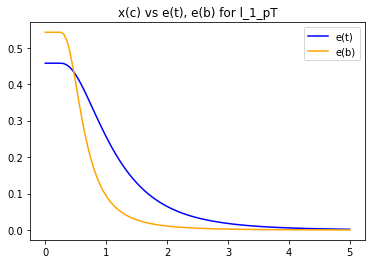

AttributeError: module 'matplotlib.pyplot' has no attribute 'trapz'

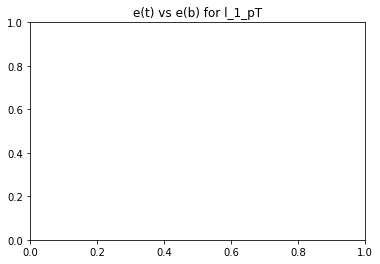

In [28]:
opt = testall(df, all_items)

In [27]:
opt

[[0.9000000000000004,
  0.7999999999999999,
  0,
  1.0500000000000005,
  0.7,
  0,
  1.0500000000000005,
  0,
  1.5500000000000005,
  0.7500000000000002,
  0.8500000000000003,
  1.1000000000000003,
  1.1900000000000004,
  2.119999999999998,
  0.8600000000000003,
  1.4800000000000004,
  1.5000000000000002,
  0.3],
 [0.7080942,
  0.5836204,
  0.5424346,
  0.609023,
  0.572892,
  0.5424346,
  0.7246158,
  0.5424346,
  0.6341664,
  0.6886438,
  0.6530218,
  0.712001,
  0.5521284,
  0.5857862,
  0.6521406,
  0.6224436,
  0.5354354,
  0.620274],
 [0.2919058,
  0.41637959999999996,
  0.4575654,
  0.390977,
  0.42710800000000004,
  0.4575654,
  0.27538419999999997,
  0.4575654,
  0.3658336,
  0.31135619999999997,
  0.3469782,
  0.287999,
  0.44787160000000004,
  0.41421379999999997,
  0.34785940000000004,
  0.3775564,
  0.4645646,
  0.379726]]

## Cut Flow

### Exercise 4

#### Part a
For each above scenario, choose a subset (minumum 3) of observables to use for selections, and values of $x_c$ based on your significance plots (part 3c). 

#### Part b
Create a "cut-flow" table for each scenario where you successively make the selections on each observable and tabulate $\epsilon_S$, $\epsilon_B$, $N'_S$, $N'_B$, and $\sigma_{S'}$.

#### Part c
In 3c above you computed the significance for each observable assuming to make no other selections on any other observable. If the variables are correlated, then this assumption can lead to non-optimial results when selecting on multiple variables. By looking at the correlation matrices and your answers to 4b, identify where this effect could be most detrimental to the significance. Attempt to correct the issue by applying the selection in one observable and then optimizing (part 3c) for a second observable. What happens if you change the order of your selection (make selection on second and optimize on first)?




In [ ]:
def test_significance(elist, tested):
    o_s = list()
    N_sa = list()
    N_ba = list()
    E_s = elist[1]
    E_b = elist[2]
    N_s = [10, 100, 1000, 10000]
    N_b = [100, 1000, 10000, 100000]
    plt.figure(figsize=(25, 25), dpi=60)
    for q, e in enumerate(tested):
        templist = list()
        v = e
        Nsaa = list()
        Nsbb = list()
        oss = list()
        for t, n in enumerate(N_s):
            Nis = E_s[q]*n
            Nib = E_b[q]*N_b[t]
            templist.append(Nis/(np.sqrt(Nis+Nib)))
        plt.scatter([1, 2, 3, 4], templist)
        for c, t in enumerate(templist):
            plt.text([1, 2, 3, 4][c], t, v)
    col = list()
    for t, n in enumerate(N_s):
        print('senario '+str(t))
        row = list()
        Nsaa = list()
        Nsbb = list()
        oss = list()
        for q, e in enumerate(tested):
            Nis = E_s[q]*n
            Nib = E_b[q]*N_b[t]
            print(str(e)+' significance: '+str(Nis/(np.sqrt(Nis+Nib))))
            row.append(Nis/(np.sqrt(Nis+Nib)))
            Nsbb.append(Nib)
            Nsaa.append(Nis)
            oss.append(Nis/(np.sqrt(Nis+Nib)))
        col.append(row)
        N_sa.append(Nsaa)
        N_ba.append(Nsbb)
        o_s.append(oss)
        print('=======')
    full = list()
    for n, c in enumerate(tested):
        temp = list()
        temp.append(E_s[n])
        temp.append(E_b[n])
        for t in range(len(N_sa)):
            temp.append(N_sa[t][n])
            temp.append(N_ba[t][n])
            temp.append(o_s[t][n])
        full.append(temp)
    return pd.DataFrame(full, tested, columns = ['e_s', 'e_b', "N's_1", "N'b_1", "o's_1", "N's_2", "N'b_2", "o's_2", "N's_3", "N'b_3", "o's_3", "N's_4", "N'b_4", "o's_4"])

In [ ]:
optsig = test_significance(opt, VarNames[1:])

In [69]:
optsig

,e_s,e_b,N's_1,N'b_1,o's_1,N's_2,N'b_2,o's_2,N's_3,N'b_3,o's_3,N's_4,N'b_4,o's_4
l_1_pT,0.708094,0.291906,7.080942,29.19058,1.175731,70.80942,291.9058,3.717989,708.0942,2919.058,11.757315,7080.942,29190.58,37.179894
l_1_eta,0.583620,0.416380,5.836204,41.63796,0.847036,58.36204,416.3796,2.678563,583.6204,4163.796,8.470359,5836.204,41637.96,26.785626
l_1_phi,0.542435,0.457565,5.424346,45.75654,0.758217,54.24346,457.5654,2.397692,542.4346,4575.654,7.582169,5424.346,45756.54,23.976925
l_2_pT,0.609023,0.390977,6.090230,39.09770,0.905988,60.90230,390.9770,2.864986,609.0230,3909.770,9.059881,6090.230,39097.70,28.649858
l_2_eta,0.572892,0.427108,5.728920,42.71080,0.823137,57.28920,427.1080,2.602987,572.8920,4271.080,8.231367,5728.920,42710.80,26.029867
l_2_phi,0.542435,0.457565,5.424346,45.75654,0.758217,54.24346,457.5654,2.397692,542.4346,4575.654,7.582169,5424.346,45756.54,23.976925
MET,0.724616,0.275384,7.246158,27.53842,1.228611,72.46158,275.3842,3.885209,724.6158,2753.842,12.286111,7246.158,27538.42,38.852094
MET_phi,0.542435,0.457565,5.424346,45.75654,0.758217,54.24346,457.5654,2.397692,542.4346,4575.654,7.582169,5424.346,45756.54,23.976925
MET_rel,0.634166,0.365834,6.341664,36.58336,0.967939,63.41664,365.8336,3.060892,634.1664,3658.336,9.679389,6341.664,36583.36,30.608916
axial_MET,0.688644,0.311356,6.886438,31.13562,1.116804,68.86438,311.3562,3.531643,688.6438,3113.562,11.168037,6886.438,31135.62,35.316433


In [81]:
optsigswitch = optsig.transpose()
oo = np.corrcoef(optsig)

display(HTML(tabulate.tabulate(oo, tablefmt='html', headers=VarNames[1:])))
ot = np.corrcoef(optsigswitch)

display(HTML(tabulate.tabulate(ot, tablefmt='html', headers=['e_s', 'e_b', "N's_1", "N'b_1", "o's_1", "N's_2", "N'b_2", "o's_2", "N's_3", "N'b_3", "o's_3", "N's_4", "N'b_4", "o's_4"])))

l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
1,0.994823,0.992386,0.996289,0.99419,0.992386,0.999797,0.992386,0.997647,0.999778,0.998553,0.99999,0.992959,0.99495,0.998513,0.99703,0.991974,0.996913
0.994823,1,0.999765,0.999878,0.999982,0.999765,0.992575,0.999765,0.999449,0.996745,0.998848,0.994349,0.999857,0.999999,0.998883,0.999695,0.999688,0.999731
0.992386,0.999765,1,0.999304,0.999878,1,0.989705,1,0.998495,0.994763,0.997574,0.991814,0.999989,0.999737,0.997624,0.998924,0.999995,0.998993
0.996289,0.999878,0.999304,1,0.999765,0.999304,0.994354,0.999304,0.999846,0.997883,0.999476,0.995886,0.99947,0.999897,0.999499,0.999959,0.999176,0.999971
0.99419,0.999982,0.999878,0.999765,1,0.999878,0.991821,0.999878,0.99923,0.996239,0.99854,0.993689,0.999941,0.999973,0.998579,0.999527,0.999821,0.999572
0.992386,0.999765,1,0.999304,0.999878,1,0.989705,1,0.998495,0.994763,0.997574,0.991814,0.999989,0.999737,0.997624,0.998924,0.999995,0.998993
0.999797,0.992575,0.989705,0.994354,0.991821,0.989705,1,0.989705,0.996065,0.99915,0.997268,0.999879,0.990373,0.992727,0.997214,0.995278,0.989227,0.99513
0.992386,0.999765,1,0.999304,0.999878,1,0.989705,1,0.998495,0.994763,0.997574,0.991814,0.999989,0.999737,0.997624,0.998924,0.999995,0.998993
0.997647,0.999449,0.998495,0.999846,0.99923,0.998495,0.996065,0.998495,1,0.998871,0.99989,0.997324,0.998744,0.99949,0.999901,0.999964,0.998308,0.99995
0.999778,0.996745,0.994763,0.997883,0.996239,0.994763,0.99915,0.994763,0.998871,1,0.999465,0.999671,0.995237,0.996846,0.999441,0.998433,0.99442,0.998347


e_s,e_b,N's_1,N'b_1,o's_1,N's_2,N'b_2,o's_2,N's_3,N'b_3,o's_3,N's_4,N'b_4,o's_4
1,-1,1,-1,0.997782,1,-1,0.997782,1,-1,0.997782,1,-1,0.997782
-1,1,-1,1,-0.997782,-1,1,-0.997782,-1,1,-0.997782,-1,1,-0.997782
1,-1,1,-1,0.997782,1,-1,0.997782,1,-1,0.997782,1,-1,0.997782
-1,1,-1,1,-0.997782,-1,1,-0.997782,-1,1,-0.997782,-1,1,-0.997782
0.997782,-0.997782,0.997782,-0.997782,1,0.997782,-0.997782,1,0.997782,-0.997782,1,0.997782,-0.997782,1
1,-1,1,-1,0.997782,1,-1,0.997782,1,-1,0.997782,1,-1,0.997782
-1,1,-1,1,-0.997782,-1,1,-0.997782,-1,1,-0.997782,-1,1,-0.997782
0.997782,-0.997782,0.997782,-0.997782,1,0.997782,-0.997782,1,0.997782,-0.997782,1,0.997782,-0.997782,1
1,-1,1,-1,0.997782,1,-1,0.997782,1,-1,0.997782,1,-1,0.997782
-1,1,-1,1,-0.997782,-1,1,-0.997782,-1,1,-0.997782,-1,1,-0.997782
